# Free Spinning Tops in the Space Frame

We spent some time discussing the motion of rotating objects from the "body" reference frame, i.e. axes fixed relative to the rotating object. Of course, we usually do not observe these objects in the body frame. Rather, we typically observe this spinning tops in the "space" frame, an inertial frame of reference. So, let's finish the job and cut a path back from the body frame to the space frame.

## The Gist of It

The Euler equations give us a system of ODEs that describe how $\vec{\omega}$ changes with time in the body frame. The Euler angles tell us how the body frame axes, i.e. the principal axes of the rotating object, are oriented relative to the space frame. There turns out to be an easy relationship between two of the Euler angles ($\theta$ and $\psi$) and the components of $\vec{\omega}$ and the principal moments, $\lambda_{i}$. The last Euler angle, $\phi$, does not have such an easy relationship; but never fear. We'll use the relationship between $\vec{\omega}$ and the derivatives of the Euler angles to find an ODE for $\phi$. We'll let Python solve the ODEs for $\vec{\omega}$ and $\phi$ for us. Once we have the Euler angles as functions of time, it's easy to rotate the body frame axes, i.e. the principal axes fo the rotating object, back to the space frame.

## Quick Recap of Euler Equations

Recall that we decided to work in the body frame to save us from having to work out time-depedent rotational inertia tensors. We start from the definition of torque
$$\Gamma=\left(\frac{d\vec{L}}{dt}\right)_{\mathrm{space}}$$
Using previous lessons about non-inertial reference frames, we can relate the derivatives of angular momentum in the space frame to that in the body frame
$$\vec{\Gamma}=\left(\frac{d\vec{L}}{dt}\right)_{\mathrm{space}}=\left(\frac{d\vec{L}}{dt}\right)_{\mathrm{body}}+\vec{\omega}\times\vec{L}$$
We specifically choose the body frame so that the inertia tensor, $\overleftrightarrow{I}$ is constant, so the derivative of $\vec{L}$ in the body frame is simply $\overleftrightarrow{I}\dot{\vec{\omega}}$. Putting it together
$$\vec{\Gamma}=\overleftrightarrow{I}\dot{\vec{\omega}}+\vec{\omega}\times\overleftrightarrow{I}\vec{\omega}$$
We furthermore choose the body frame specifically to diagonalize $\overleftrightarrow{I}$, in other words, the body frame axes align with the principle axes of the rotating object. Consequently we can calculate the cross-product
$$\begin{vmatrix}
\hat{e}_{1} & \hat{e}_{2} & \hat{e}_{3}\\
\omega_{1} & \omega_{2} & \omega_{3}\\
\lambda_{1}\omega_{1} & \lambda_{2}\omega_{2} & \lambda_{3}\omega_{3}
\end{vmatrix}=\hat{e}_{1}\left(\lambda_{3}-\lambda_{2}\right)\omega_{2}\omega_{3}-\hat{e}_{2}\left(\lambda_{3}-\lambda_{1}\right)\omega_{1}\omega_{3}+\hat{e}_{3}\left(\lambda_{2}-\lambda_{1}\right)\omega_{1}\omega_{2}$$
Finally, we can express the three "Euler equations" of motion for the body frame
$$\begin{equation}
\begin{split}
\Gamma_{1} & = \lambda_{1}\dot{{\omega}}_{1}-\left(\lambda_{2}-\lambda_{3}\right)\omega_{2}\omega_{3} \\
\Gamma_{2} & = \lambda_{2}\dot{{\omega}}_{2}-\left(\lambda_{3}-\lambda_{1}\right)\omega_{1}\omega_{3} \\
\Gamma_{3} & = \lambda_{3}\dot{{\omega}}_{3}-\left(\lambda_{1}-\lambda_{2}\right)\omega_{1}\omega_{2}
\end{split}
\end{equation}$$

If our object is not subject to any external torques, the left side of each Euler equation is 0, and we have three coupled first-order ODEs that define the evolution of $\vec{\omega}$ in the body frame
$$\begin{equation}
\begin{split}
\dot{{\omega}}_{1} & = \frac{\lambda_{2}-\lambda_{3}}{\lambda_{1}}\omega_{2}\omega_{3} \\
\dot{{\omega}}_{2} & = \frac{\lambda_{3}-\lambda_{1}}{\lambda_{2}}\omega_{1}\omega_{3} \\
\dot{{\omega}}_{3} & = \frac{\lambda_{1}-\lambda_{2}}{\lambda_{3}}\omega_{1}\omega_{2}
\end{split}
\end{equation}$$
These equations can easily be solved numerically using odeint, as we'll do shortly. Here's an example of how these can be coded up for odeint

In [ ]:
def deriv(w,t,l1,l2,l3): # return derivatives of the array w
    w1, w2, w3 = w
    dwdt = [(l2-l3)*w2*w3/l1, (l3-l1)*w1*w3/l2, (l1-l2)*w1*w2/l3]
    return dwdt

## Rotational Matrices and the Euler Angles

Generally, you need three angles to specify the orientation of an object in space. The orientation of a rotating object is no exception. Here, we follow the convention of the so-called Euler angles to specify the orientation of the body frame axes to those of the space frame. The first is a rotation through an angle, $\phi$, around the $z$-axis. The second is a rotation through an angle, $\theta$, around the (new) $y$-axis. The final is a rotation through an angle, $\psi$, around the (new) $z$-axis. Rotations can be described by matrices, e.g.
$$\overleftrightarrow{R}_{z}\left(\phi\right)=\begin{bmatrix}
\cos\left(\phi\right) & \sin\left(\phi\right) & 0\\
-\sin\left(\phi\right) & \cos\left(\phi\right) & 0\\
0 & 0 & 1
\end{bmatrix}$$
$$\overleftrightarrow{R}_{y}\left(\theta\right)=\begin{bmatrix}
\cos\left(\theta\right) & 0 & -\sin\left(\theta\right)\\
0 & 1 & 0\\
\sin\left(\theta\right) & 0 & \cos\left(\theta\right)
\end{bmatrix}$$

As an important example, say we have an angular momentum of $\vec{L}=L\hat{z}$ in the space frame. We can express this in the body frame by rotating through the Euler angles. First, we rotate through $\phi$ about the $z$-axis, which leaves $\vec{L}$ unchanged. Second, we rotate through $\theta$ about the new $y$-axis:
$$\overleftrightarrow{R}_{y}\left(\theta\right)\overleftrightarrow{R}_{z}\left(\phi\right)\vec{L}=\begin{bmatrix}
\cos\left(\theta\right) & 0 & -\sin\left(\theta\right)\\
0 & 1 & 0\\
\sin\left(\theta\right) & 0 & \cos\left(\theta\right)
\end{bmatrix}\begin{bmatrix}
0\\
0\\
L
\end{bmatrix}=L\begin{bmatrix}
-\sin\left(\theta\right)\\
0\\
\cos\left(\theta\right)
\end{bmatrix}
$$
Finally, we rotate through the final angle, $\psi$, about the new $z$-axis:
$$\overleftrightarrow{R}_{z}\left(\psi\right)\overleftrightarrow{R}_{y}\left(\theta\right)\overleftrightarrow{R}_{z}\left(\phi\right)\vec{L}=\begin{bmatrix}
\cos\left(\psi\right) & \sin\left(\psi\right) & 0\\
-\sin\left(\psi\right) & \cos\left(\psi\right) & 0\\
0 & 0 & 1
\end{bmatrix}\begin{bmatrix}
-L\sin\left(\theta\right)\\
0\\
L\cos\left(\theta\right)
\end{bmatrix}=L\begin{bmatrix}
-\sin\left(\theta\right)\cos\left(\psi\right)\\
\sin\left(\theta\right)\sin\left(\psi\right)\\
\cos\left(\theta\right)
\end{bmatrix}
$$
Below, I show a simple (and probably overly verbose) example of how you can rotate an arbitrary vector in Python.

In [ ]:
def rotate(vec,phi,theta,psi):
    mrotz  = [[    np.cos(phi), np.sin(phi), 0.],
              [-1.*np.sin(phi), np.cos(phi), 0.],
              [    0.,          0.,          1.]]
    mrotyp = [[np.cos(theta), 0., -1.*np.sin(theta)],
              [0.,            1.,     0.           ],
              [np.sin(theta), 0.,     np.cos(theta)]]
    mrotzp = [[    np.cos(psi), np.sin(psi), 0.],
              [-1.*np.sin(psi), np.cos(psi), 0.],
              [    0.,          0.,          1.]]
    
    vecrotz = [0,0,0]
    vecrotz[0] = mrotz[0][0]*vec[0] + mrotz[0][1]*vec[1] + mrotz[0][2]*vec[2]
    vecrotz[1] = mrotz[1][0]*vec[0] + mrotz[1][1]*vec[1] + mrotz[1][2]*vec[2]
    vecrotz[2] = mrotz[2][0]*vec[0] + mrotz[2][1]*vec[1] + mrotz[2][2]*vec[2]
    
    vecrotyp = [0,0,0]
    vecrotyp[0] = mrotyp[0][0]*vecrotz[0] + mrotyp[0][1]*vecrotz[1] + mrotyp[0][2]*vecrotz[2]
    vecrotyp[1] = mrotyp[1][0]*vecrotz[0] + mrotyp[1][1]*vecrotz[1] + mrotyp[1][2]*vecrotz[2]
    vecrotyp[2] = mrotyp[2][0]*vecrotz[0] + mrotyp[2][1]*vecrotz[1] + mrotyp[2][2]*vecrotz[2]
    
    vecrotzp = [0,0,0]
    vecrotzp[0] = mrotzp[0][0]*vecrotyp[0] + mrotzp[0][1]*vecrotyp[1] + mrotzp[0][2]*vecrotyp[2]
    vecrotzp[1] = mrotzp[1][0]*vecrotyp[0] + mrotzp[1][1]*vecrotyp[1] + mrotzp[1][2]*vecrotyp[2]
    vecrotzp[2] = mrotzp[2][0]*vecrotyp[0] + mrotzp[2][1]*vecrotyp[1] + mrotzp[2][2]*vecrotyp[2]

    return vecrotzp

One more important example is a useful expression for $\vec{\omega}$. We can express $\vec{\omega}$ in terms of derivatives of the Euler angles
$$\vec{\omega}=\dot{\phi}\hat{z}+\dot{\theta}\hat{e}_{2}'+\dot{\psi}\hat{e}_{3}$$
Using our result above, we can quickly express the first term
$$\dot{\phi}\hat{z}=-\dot{\phi}\sin\left(\theta\right)\cos\left(\psi\right)\hat{e}_{1}+\dot{\phi}\sin\left(\theta\right)\sin\left(\psi\right)\hat{e}_{2}+\dot{\phi}\cos\left(\theta\right)\hat{e}_{3}$$
For the second term, we rotate the $\hat{e}_{2}'$ axis through $\psi$ around the $z$-axis
$$\overleftrightarrow{R}_{z}\left(\psi\right)\hat{e}_{2}'=\begin{bmatrix}
\cos\left(\psi\right) & \sin\left(\psi\right) & 0\\
-\sin\left(\psi\right) & \cos\left(\psi\right) & 0\\
0 & 0 & 1
\end{bmatrix}\begin{bmatrix}
0\\
1\\
0
\end{bmatrix}=\begin{bmatrix}
\sin\left(\psi\right)\\
\cos\left(\psi\right)\\
0
\end{bmatrix}
$$
So, in the body frame, the second term becomes
$$\dot{\theta}\hat{e}_{2}'=\dot{\theta}\sin\left(\psi\right)\hat{e}_{1}+\dot{\theta}\cos\left(\psi\right)\hat{e}_{2}$$
The final term is already in the body frame, so putting it altogether
$$\vec{\omega} = \left[\dot{\theta}\sin\left(\psi\right) - \dot{\phi}\sin\left(\theta\right)\cos\left(\psi\right)\right]\hat{e}_{1} + \left[\dot{\theta}\cos\left(\psi\right) + \dot{\phi}\sin\left(\theta\right)\sin\left(\psi\right)\right]\hat{e}_{2} + \left[\dot{\psi} + \dot{\phi}\cos\left(\theta\right)\right]\hat{e}_{3}$$

## Transforming from the Body Frame to the Space Frame

Our previous examples now gives us an easy way to express the Euler angles in terms of the angular velocities in the body frame. This will be the key to transforming from the body frame back to the space frame. We know that in the body frame, the angular momentum vector can be expressed $\vec{L}=\lambda_{1}\omega_{1}\hat{e}_{1}+\lambda_{2}\omega_{2}\hat{e}_{2}+\lambda_{3}\omega_{3}\hat{e}_{3}$. Now, we've also solved for $\vec{L}$ in the body frame using the Euler angles. Setting these equal, we find
$$\begin{equation}
\begin{split}
\lambda_{1}\omega_{1} & = -L\sin\left(\theta\right)\cos\left(\psi\right) \\
\lambda_{2}\omega_{2} & = L\sin\left(\theta\right)\sin\left(\psi\right) \\
\lambda_{3}\omega_{3} & = L\cos\left(\theta\right)
\end{split}
\end{equation}$$
Very quickly, we see that
$$\theta=\cos^{-1}\left(\frac{\lambda_{3}\omega_{3}}{L}\right)$$
Furthermore, we can take the ratio of the first two equations to obtain
$$\psi=\tan^{-1}\left(\frac{\lambda_{2}\omega_{2}}{-\lambda_{1}\omega_{1}}\right)$$
So, that's two of the Euler equations. We still need $\phi$, and we can get this one from what we know about $\vec{\omega}$. We know that
$$\begin{equation}
\begin{split}
\omega_{1} & = \dot{\theta}\sin\left(\psi\right) - \dot{\phi}\sin\left(\theta\right)\cos\left(\psi\right) \\
\omega_{2} & = \dot{\theta}\cos\left(\psi\right) + \dot{\phi}\sin\left(\theta\right)\sin\left(\psi\right)
\end{split}
\end{equation}$$
We can eliminate the first terms as follows:
$$\omega_{2}\sin\left(\psi\right)-\omega_{1}\cos\left(\psi\right) = \dot{\phi}\sin\left(\theta\right)$$
Making use of the above equations, we can subsitute for the $\psi$ terms
$$\dot{\phi}\sin\left(\theta\right)=\frac{\lambda_{2}\omega^{2}_{2}}{L\sin\left(\theta\right)}+\frac{\lambda_{1}\omega^{2}_{1}}{L\sin\left(\theta\right)}$$
Now, we can divide by $\sin\left(\theta\right)$ and wind up with a $\sin^{2}\left(\theta\right)$ term in the denominator of the right-hand term. The easiest way to get rid of this term is to square the above $L_{x}$ and $L_{y}$ terms, which added together yield $\lambda^{2}_{1}\omega^{2}_{1}+\lambda^{2}_{2}\omega^{2}_{2} = L^{2}\sin^{2}\left(\theta\right)$. Plugging this in we find
$$\dot{\phi}=L\frac{\lambda_{1}\omega^{2}_{1}+\lambda_{2}\omega^{2}_{2}}{\lambda^{2}_{1}\omega^{2}_{1}+\lambda^{2}_{2}\omega^{2}_{2}}$$
This is, again, a first-order ODE that can be solved numerically simultaneous with the three first-order ODEs for the components of $\vec{\omega}$. Below I show an example of how this can be programed in for odeint, along with the ODEs for $\vec{\omega}$.

In [ ]:
def deriv(w,t,l1,l2,l3): # return derivatives of the array w
    w1, w2, w3, phi = w
    L = np.sqrt(l1*l1*w1*w1+l2*l2*w2*w2+l3*l3*w3*w3)
    dwdt = [(l2-l3)*w2*w3/l1, (l3-l1)*w1*w3/l2, (l1-l2)*w1*w2/l3, L*(l1*w1*w1+l2*w2*w2)/(l1*l1*w1*w1+l2*l2*w2*w2)]
    return dwdt

## Recap

We now have everything we need to transform back from the body frame to the space frame. The procedure is as follows: Take the space-frame constant angular momentum vector to be aligned with the space frame $z$-axis. The initial Euler angles can be set based upon the initial orientation of the object's principal axes. The initial angular velocity components in the body frame are set by the simple relationship $L_{i}=\lambda_{i}\omega_{i}$. The Euler ODEs can be solved along with
$$\dot{\phi}=L\frac{\lambda_{1}\omega^{2}_{1}+\lambda_{2}\omega^{2}_{2}}{\lambda^{2}_{1}\omega^{2}_{1}+\lambda^{2}_{2}\omega^{2}_{2}}$$
to yield the time-dependence of $\vec{\omega}$ in the body frame, as well as $\phi$. The other two Euler angles are determined easily using
$$\begin{equation}
\begin{split}
\theta & =\cos^{-1}\left(\frac{\lambda_{3}\omega_{3}}{L}\right)\\
\psi & =\tan^{-1}\left(\frac{\lambda_{2}\omega_{2}}{-\lambda_{1}\omega_{1}}\right)
\end{split}
\end{equation}$$
All Euler angles in-hand, it is simple to rotate $\vec{\omega}$ and the body-frame axes back to the space frame using the rotational matrices. Basically, we run it in reverse, rotating first through $-\psi$ around $z$, then through $-\theta$ around $y$, ending with a rotation of $-\phi$ around $z$.

# Example Code

Below, I show an example Python script for animating the motion of a free spinning top in the space frame. You can set the parameters of the top, namely its principal axes. The angular momentum vector is set to align with the $z$-axis in the space frame. You can, then, set the parameters of the rotation by selecting the intial Euler angles. One interesting phenomenon you can observe is the precession of $\vec{\omega}$ for a symmetric top. Another interesting phenomenon is the tumbling of an asymmetric top when you spin slightly out of alignment with the intermediate principal axis.

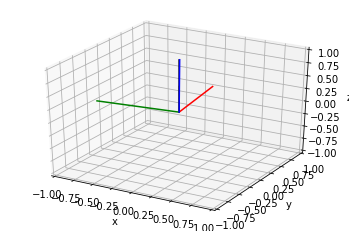

In [2]:
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint

import mpl_toolkits.mplot3d.axes3d as p3
import matplotlib.animation as animation

from matplotlib import rc       # these lines needed to run it on Colab
rc('animation', html='jshtml')  # these lines needed to run it on Colab

#---------------------------------------------------------
# Free-rotation Euler Equations for Body Frame
def deriv(w,t,l1,l2,l3): # return derivatives of the array w
    w1, w2, w3, phi = w
    L = np.sqrt(l1*l1*w1*w1+l2*l2*w2*w2+l3*l3*w3*w3)
    dwdt = [(l2-l3)*w2*w3/l1, (l3-l1)*w1*w3/l2, (l1-l2)*w1*w2/l3, L*(l1*w1*w1+l2*w2*w2)/(l1*l1*w1*w1+l2*l2*w2*w2)]
    return dwdt
# End deriv definition
#---------------------------------------------------------

#----------------------------------------------------------------------------------------
# These are the standard rotational matrices to go from the space frame to the body frame
def rotate(vec,phi,theta,psi):
    mrotz  = [[    np.cos(phi), np.sin(phi), 0.],
              [-1.*np.sin(phi), np.cos(phi), 0.],
              [    0.,          0.,          1.]]
    mrotyp = [[np.cos(theta), 0., -1.*np.sin(theta)],
              [0.,            1.,     0.           ],
              [np.sin(theta), 0.,     np.cos(theta)]]
    mrotzp = [[    np.cos(psi), np.sin(psi), 0.],
              [-1.*np.sin(psi), np.cos(psi), 0.],
              [    0.,          0.,          1.]]
    
    vecrotz = [0,0,0]
    vecrotz[0] = mrotz[0][0]*vec[0] + mrotz[0][1]*vec[1] + mrotz[0][2]*vec[2]
    vecrotz[1] = mrotz[1][0]*vec[0] + mrotz[1][1]*vec[1] + mrotz[1][2]*vec[2]
    vecrotz[2] = mrotz[2][0]*vec[0] + mrotz[2][1]*vec[1] + mrotz[2][2]*vec[2]
    
    vecrotyp = [0,0,0]
    vecrotyp[0] = mrotyp[0][0]*vecrotz[0] + mrotyp[0][1]*vecrotz[1] + mrotyp[0][2]*vecrotz[2]
    vecrotyp[1] = mrotyp[1][0]*vecrotz[0] + mrotyp[1][1]*vecrotz[1] + mrotyp[1][2]*vecrotz[2]
    vecrotyp[2] = mrotyp[2][0]*vecrotz[0] + mrotyp[2][1]*vecrotz[1] + mrotyp[2][2]*vecrotz[2]
    
    vecrotzp = [0,0,0]
    vecrotzp[0] = mrotzp[0][0]*vecrotyp[0] + mrotzp[0][1]*vecrotyp[1] + mrotzp[0][2]*vecrotyp[2]
    vecrotzp[1] = mrotzp[1][0]*vecrotyp[0] + mrotzp[1][1]*vecrotyp[1] + mrotzp[1][2]*vecrotyp[2]
    vecrotzp[2] = mrotzp[2][0]*vecrotyp[0] + mrotzp[2][1]*vecrotyp[1] + mrotzp[2][2]*vecrotyp[2]

    return vecrotzp

#------------------------------------------------------------------------------------
# These are the rotational matrices to go from the body frame back to the space frame
def rotateback(vec,phi,theta,psi):
    mrotzp = [[np.cos(psi),-1*np.sin(psi),0],
              [np.sin(psi),   np.cos(psi),0],
              [0,             0,          1]]
    mrotyp = [[   np.cos(theta),0,np.sin(theta)],
              [   0,            1,0            ],
              [-1*np.sin(theta),0,np.cos(theta)]]
    mrotz = [[np.cos(phi),-1*np.sin(phi),0],
             [np.sin(phi),   np.cos(phi),0],
             [0,             0,          1]]
    
    vecrotzp = [0,0,0]
    vecrotzp[0] = mrotzp[0][0]*vec[0] + mrotzp[0][1]*vec[1] + mrotzp[0][2]*vec[2]
    vecrotzp[1] = mrotzp[1][0]*vec[0] + mrotzp[1][1]*vec[1] + mrotzp[1][2]*vec[2]
    vecrotzp[2] = mrotzp[2][0]*vec[0] + mrotzp[2][1]*vec[1] + mrotzp[2][2]*vec[2]
    
    vecrotyp = [0,0,0]
    vecrotyp[0] = mrotyp[0][0]*vecrotzp[0] + mrotyp[0][1]*vecrotzp[1] + mrotyp[0][2]*vecrotzp[2]
    vecrotyp[1] = mrotyp[1][0]*vecrotzp[0] + mrotyp[1][1]*vecrotzp[1] + mrotyp[1][2]*vecrotzp[2]
    vecrotyp[2] = mrotyp[2][0]*vecrotzp[0] + mrotyp[2][1]*vecrotzp[1] + mrotyp[2][2]*vecrotzp[2]

    vecrotz = [0,0,0]
    vecrotz[0] = mrotz[0][0]*vecrotyp[0] + mrotz[0][1]*vecrotyp[1] + mrotz[0][2]*vecrotyp[2]
    vecrotz[1] = mrotz[1][0]*vecrotyp[0] + mrotz[1][1]*vecrotyp[1] + mrotz[1][2]*vecrotyp[2]
    vecrotz[2] = mrotz[2][0]*vecrotyp[0] + mrotz[2][1]*vecrotyp[1] + mrotz[2][2]*vecrotyp[2]
    
    return vecrotz

#---------------------------------------------------------
# set up the figure
fig = plt.figure()
ax = plt.axes(projection="3d")
ax.set_xlim3d([-1.0,1.0])
ax.set_ylim3d([-1.0,1.0])
ax.set_zlim3d([-1.0,1.0])
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

#---------------------------------------------------------
# set the principal moments of the top
#   none equal --> asymmetric top
#   two equal --> symmetric top
lam1 = 1.   # e1
lam2 = 3.   # e2
lam3 = 2.   # e3

# Set the initial Euler angles
#   It's helpful to look at the angular velocity values,
#     below to set the itial rotation, e.g.
#     set theta0 = 0 to rotate perfectly around e3-axis
#     set theta0 = -90º and psi0 = 0 to rotate perfectly around e1-axis
#     set theta0 = 90º and psi0 = 90º to rotate perfectly around e2-axis
#   
phi0   =  0.0*np.pi/180.0   # rotate around z
theta0 =  0.5*np.pi/180.0   # rotate around y'
psi0   =  0.0*np.pi/180.0   # rotate around z'

# Set the angular momentum vector to the z-direction in the space frame
L = 1.0 # define a magnitude for the angular momentum vector
# Set the initial angular velocity vectors in the body frame
w10 = -1.*L*np.sin(theta0)*np.cos(psi0)/lam1
w20 =     L*np.sin(theta0)*np.sin(psi0)/lam2
w30 =     L*np.cos(theta0)/lam3

w0 = [w10, w20, w30, phi0]

NFRAMES = 300
t = np.linspace(0, 150, NFRAMES)
wb = odeint(deriv,w0,t,args=(lam1,lam2,lam3))
w1b = wb[:,0]
w2b = wb[:,1]
w3b = wb[:,2]
L1b = lam1*w1b # angular momentum in body frame
L2b = lam2*w2b # angular momentum in body frame
L3b = lam3*w3b # angular momentum in body frame
Lb  = [L1b,L2b,L3b]

# Euler angles
phi   = wb[:,3]
theta = np.arccos(lam3*w3b/L)
# You really gotta use arctan2, otherwise Python will hand you the wrong angle
#    By default, arctan returns an angle within the range ±π/2.
#    We need the "four-quadrant" angle! Trust me...I learned this the hard way...
psi   = np.arctan2(lam2*w2b,-1*lam1*w1b)

# Initialize the angular momentum and velocity vectors
Ls0 = rotateback( [L1b[0],L2b[0],L3b[0]], phi[0],theta[0],psi[0] )  # this should stay constant
ws0 = rotateback( [w1b[0],w2b[0],w3b[0]], phi[0],theta[0],psi[0] )  # this should change, in general

# Initialize the body-frame axes
bx0 = rotateback( [1,0,0], phi[0],theta[0],psi[0] )
by0 = rotateback( [0,1,0], phi[0],theta[0],psi[0] )
bz0 = rotateback( [0,0,1], phi[0],theta[0],psi[0] )

wline, = ax.plot3D( [0,ws0[0]], [0,ws0[1]], [0,ws0[2]],'y' )
Lline, = ax.plot3D( [0,Ls0[0]], [0,Ls0[1]], [0,Ls0[2]],'k' )

bxline, = ax.plot3D( [0,bx0[0]],[0,bx0[1]],[0,bx0[2]],'r' )
byline, = ax.plot3D( [0,by0[0]],[0,by0[1]],[0,by0[2]],'g' )
bzline, = ax.plot3D( [0,bz0[0]],[0,bz0[1]],[0,bz0[2]],'b' )

def animate(i):

    # transform back to space frame
    Ls = rotateback( [L1b[i],L2b[i],L3b[i]], phi[i],theta[i],psi[i] )
    ws = rotateback( [w1b[i],w2b[i],w3b[i]], phi[i],theta[i],psi[i] )
    
    bx = rotateback( [1,0,0], phi[i],theta[i],psi[i] )
    by = rotateback( [0,1,0], phi[i],theta[i],psi[i] )
    bz = rotateback( [0,0,1], phi[i],theta[i],psi[i] )
    
    wline.set_xdata( [0,ws[0]] )
    wline.set_ydata( [0,ws[1]] )
    wline.set_3d_properties( [0,ws[2]] )

    Lline.set_xdata( [0,Ls[0]] )
    Lline.set_ydata( [0,Ls[1]] )
    Lline.set_3d_properties( [0,Ls[2]] )

    bxline.set_xdata( [0,bx[0]] )
    bxline.set_ydata( [0,bx[1]] )
    bxline.set_3d_properties( [0,bx[2]] )

    byline.set_xdata( [0,by[0]] )
    byline.set_ydata( [0,by[1]] )
    byline.set_3d_properties( [0,by[2]] )

    bzline.set_xdata( [0,bz[0]] )
    bzline.set_ydata( [0,bz[1]] )
    bzline.set_3d_properties( [0,bz[2]] )

    return wline,Lline,bxline,byline,bzline

line_ani = animation.FuncAnimation(fig,animate,blit=True,frames=NFRAMES,interval=1)

#plt.show()  # this plots it if you're running locally on your computer
line_ani    # this plots it on Colab
